In [2]:
%matplotlib inline
from collections import Counter
import json
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
from operator import itemgetter
import pandas as pd

from sklearn.feature_extraction import DictVectorizer
from sklearn.feature_extraction.text import TfidfTransformer
from sklearn.manifold import TSNE

from time import time

In [7]:
filename = 'roam_prescription_based_prediction.jsonl'

In [8]:
def iter_dataset(filename):
    with open(filename,'rt') as fid:
        for line in fid:
            example = json.loads(line)
            yield(example['cms_prescription_counts'],example['provider_variables'])

In [9]:
full_data = [(pres_dict,provider_dict) for pres_dict,provider_dict in iter_dataset(filename) if len(pres_dict) >=50]
len(full_data)

29337

In [10]:
top_specialties = ['Cardiovascular Disease','Psychiatry','Nephrology','Neurology','Endocrinology, Diabetes & Metabolism',
                  'Family','Geriatric Medicine','Medical','Adult Health','Rheumatology']
full_data = [(prescrip,provid) for prescrip,provid in full_data if provid['specialty'] in top_specialties]
len(full_data)

24176

Now I only have practitioners who are from the specialties mentioned above and who have prescribed at least 50 kinds of drugs.

The data is in the form of list of tuples. Each tuple consists of 2 dictionaries. The first dictionary contains information regarding the drugs prescribed by a practitioners and number of times they were prescribed. The second dictionary contains information about the practitioner including his specialty.

I will split the dictionaries  in to 2 variables. One variable will be the drugs which can be used as features. The second variable will be targets, which we will try to predict(such as the specialty).

In [11]:
drugs, targets = zip(*full_data)

The targets are converted to pandas table, where each column can be considered as a target. 

Here I also convert the specialties to be considered as categories

In [12]:
targets = pd.DataFrame(list(targets))
target_spec = targets['specialty'].astype('category')
targets.head()


,brand_name_rx_count,gender,generic_rx_count,region,settlement_type,specialty,years_practicing
0,384,M,2287,South,non-urban,Nephrology,7
1,316,M,1035,West,non-urban,Nephrology,6
2,683,M,3462,Midwest,urban,Psychiatry,7
3,143,M,2300,Northeast,urban,Psychiatry,7
4,260,F,1730,South,non-urban,Family,6


The drugs can be consisered as a bag of words. They are similar to number of times a word was repeated in a sentence (something like that). So first, I will convert them to a matrix representation where each row will be for a practitioner, and each column is a drug name(feature) using DictVectorizer. Next I will perform tfidf on it.

In [8]:
vectorizer = DictVectorizer(sparse=False)
X = vectorizer.fit_transform(drugs)
X = TfidfTransformer().fit_transform(X)
X = X.toarray()

In [9]:
print('Shape of X :{}'.format(X.shape))
#There are 24176 practitioners and 1986 drugs.
#So for most doctor most of the drug values in the matrix will be zero.
print (X[0])

Shape of X :(24176, 1986)
[ 0.         0.         0.0302442 ...,  0.         0.         0.       ]


In the previous notebook, I had tried Logistic regression, and found that it was possible to predict a medical practitioner's specialty using their prescription information (f1-score=0.8). While most of the specialties were very robustly predicted, 'Adult Health' and 'Medical' were the 2 specialties that were mostly mis-classified (f1-score < 0.2). 

Here I am trying to embed the prescription data into 2D and 3D to check if they are clustering. Also, it would provide information of how the clustering matches with the specialty of the practitioner. 


## 2D embedding

### Using PCA

In [49]:
from sklearn.decomposition import TruncatedSVD

t0 = time()
print ("Computing PCA : ")

X_pca = TruncatedSVD(n_components=2).fit_transform(X)
t_done = time()-t0
print ("DONE : ",t_done)

Computing PCA : 
DONE :  1.8329930305480957


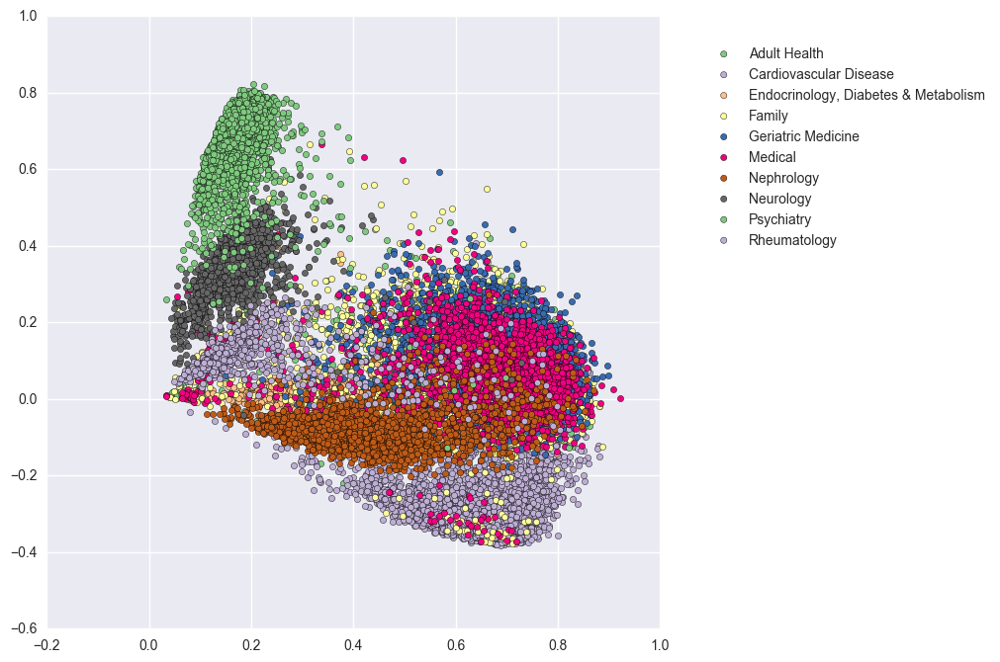

In [52]:
palette = np.array(sns.color_palette('Accent',10))
fig_pca = plt.figure(figsize=(8,8))

ax = plt.subplot()#(aspect='equal')
for i in range(10):
    xdata = X_pca[target_spec.cat.codes==i,0]
    ydata = X_pca[target_spec.cat.codes==i,1]
    c_select = palette[i]
    ax.scatter(xdata,ydata,c=c_select,label=target_spec.cat.categories.tolist()[i])

ax.legend(bbox_to_anchor=(1.55, 0.97))
plt.show()
#fig1.savefig('TSNE_euclid1.png',bbox_inches='tight',pad_inches = 0.5)

PCA does not perform too well. If colors are not used then this would appear as 2 clusters. Let's try other methods for embedding.

### Using Isomap

In [10]:
from sklearn.manifold import Isomap
t0 = time()
print ("Computing Isomap : ")

X_iso = Isomap(n_components=2).fit_transform(X)
t_done = time()-t0
print ("DONE : ",t_done)

Computing Isomap : 
DONE :  2331.9592640399933


In [13]:
import pickle
with open ('top10_isomap.pkl','wb') as fid:
    pickle.dump(X_iso,fid)

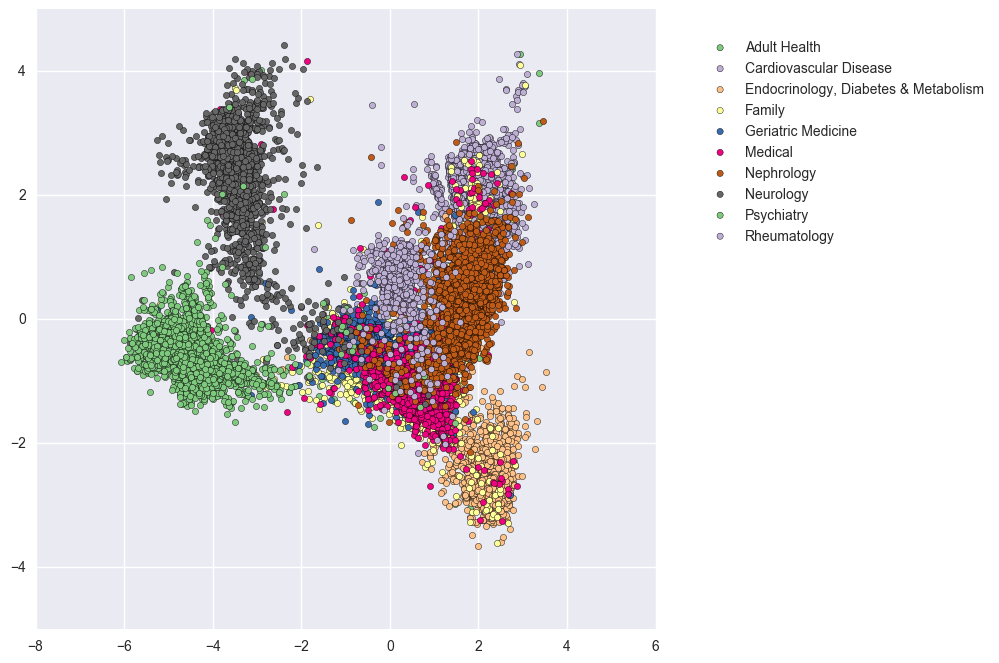

In [12]:
palette = np.array(sns.color_palette('Accent',10))
fig_iso = plt.figure(figsize=(8,8))

ax = plt.subplot()#(aspect='equal')
for i in range(10):
    xdata = X_iso[target_spec.cat.codes==i,0]
    ydata = X_iso[target_spec.cat.codes==i,1]
    c_select = palette[i]
    ax.scatter(xdata,ydata,c=c_select,label=target_spec.cat.categories.tolist()[i])

ax.legend(bbox_to_anchor=(1.55, 0.97))
plt.show()
#fig1.savefig('TSNE_euclid1.png',bbox_inches='tight',pad_inches = 0.5)

### Using TSNE

In [14]:
from sklearn.manifold import TSNE

t0 = time()
print ("Computing TSNE : ")

X_tsne = TSNE(metric='euclidean',n_components=2).fit_transform(X)
t_done = time()-t0
print ("DONE : ",t_done)

Computing TSNE : 
DONE :  2611.2274248600006


In [15]:
with open('top_10_tsne.pkl','wb') as fid1:
    pickle.dump(X_tsne,fid1)

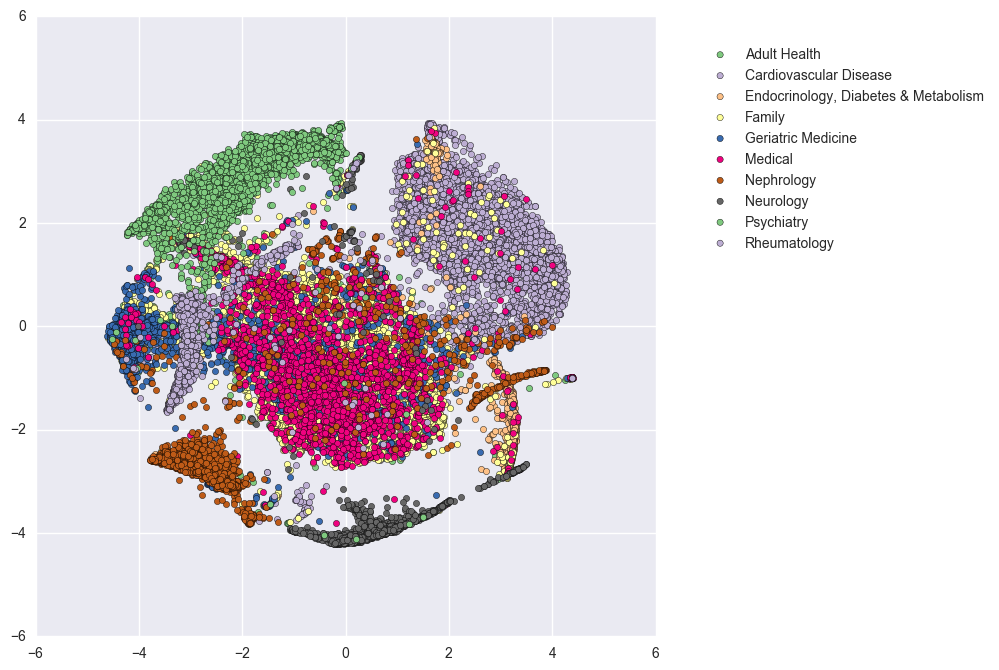

In [17]:
palette = np.array(sns.color_palette('Accent',10))
fig_lle = plt.figure(figsize=(8,8))

ax = plt.subplot()#(aspect='equal')
for i in range(10):
    xdata = X_tsne[target_spec.cat.codes==i,0]
    ydata = X_tsne[target_spec.cat.codes==i,1]
    c_select = palette[i]
    ax.scatter(xdata,ydata,c=c_select,label=target_spec.cat.categories.tolist()[i])

ax.legend(bbox_to_anchor=(1.55, 0.97))
plt.show()
#fig1.savefig('TSNE_euclid1.png',bbox_inches='tight',pad_inches = 0.5)

As observed above TSNE performs better at low dimensional embedding as it is able to maintain the local strcuture. 

## 3D Embedding

### Using PCA

In [18]:
from sklearn.decomposition import TruncatedSVD

t0 = time()
print ("Computing PCA : ")

X_pca = TruncatedSVD(n_components=3).fit_transform(X)
t_done = time()-t0
print ("DONE : ",t_done)

Computing PCA : 
DONE :  1.7979340553283691


In [3]:
import holoviews as hv
hv.notebook_extension()
print(hv.__version__)

from holoviews.plotting import plotly
from plotly.offline.offline import get_plotlyjs
from IPython.display import display,HTML

hv.notebook_extension(plotly=True)

1.6.2-858-gaaebffa


In [25]:
%%opts NdOverlay [width=900 height=900] 
%%opts Scatter3D[show_legend=True](opacity=0.1,symbol='circle')
scatters_pca = hv.NdOverlay(key_dimensions = ['Specialty'])

for i,specs in enumerate(target_spec.cat.categories.tolist()):
    xdata = X_pca[target_spec.cat.codes==i,0]
    ydata = X_pca[target_spec.cat.codes==i,1]
    zdata = X_pca[target_spec.cat.codes==i,2]
    scatters_pca[specs]=hv.Scatter3D(zip(xdata,ydata,zdata))
    
scatters_pca

b':NdOverlay   [Specialty]\n   :Scatter3D   [x,y,z]'

### Using Isomap

In [26]:
from sklearn.manifold import Isomap
t0 = time()
print ("Computing Isomap : ")

X_iso_3d = Isomap(n_components=3).fit_transform(X)
t_done = time()-t0
print ("DONE : ",t_done)

Computing Isomap : 
DONE :  2477.478539943695


In [28]:
with open('top10_isomap_3d.pkl','wb') as fid2:
    pickle.dump(X_iso_3d,fid2)
    

In [27]:
%%opts NdOverlay [width=900 height=900] 
%%opts Scatter3D[show_legend=True](opacity=0.1,symbol='circle')
scatters_iso_3d = hv.NdOverlay(key_dimensions = ['Specialty'])

for i,specs in enumerate(target_spec.cat.categories.tolist()):
    xdata = X_iso_3d[target_spec.cat.codes==i,0]
    ydata = X_iso_3d[target_spec.cat.codes==i,1]
    zdata = X_iso_3d[target_spec.cat.codes==i,2]
    scatters_iso_3d[specs]=hv.Scatter3D(zip(xdata,ydata,zdata))
    
scatters_iso_3d

b':NdOverlay   [Specialty]\n   :Scatter3D   [x,y,z]'

### Using TSNE

In [29]:
t0 = time()
print ("Computing TSNE : ")

X_tsne = TSNE(metric='euclidean',n_components=3).fit_transform(X)
t_done = time()-t0
print ("DONE : ",t_done)

Computing TSNE : 
DONE :  3160.1154239177704


In [30]:
with open('top10_tsne_3d.pkl','wb') as fid3:
    pickle.dump(X_tsne,fid3)

In [31]:
%%opts NdOverlay [width=900 height=900] 
%%opts Scatter3D[show_legend=True](opacity=0.1,symbol='circle')
scatters_tsne_3d = hv.NdOverlay(key_dimensions = ['Specialty'])

for i,specs in enumerate(target_spec.cat.categories.tolist()):
    xdata = X_tsne[target_spec.cat.codes==i,0]
    ydata = X_tsne[target_spec.cat.codes==i,1]
    zdata = X_tsne[target_spec.cat.codes==i,2]
    scatters_tsne_3d[specs]=hv.Scatter3D(zip(xdata,ydata,zdata))
    
scatters_tsne_3d

b':NdOverlay   [Specialty]\n   :Scatter3D   [x,y,z]'

During logistic regression we had obervsed that 'Adult Health', 'Medical' and 'Family' were difficult tp classify and had a very low f1-score. Let look that the 3D embedding of these classes compared to those that classified well.

In [5]:
import pickle
with open('top10_tsne_3d.pkl','rb') as fid3:
    X_tsne = pickle.load(fid3)

In [16]:
%%opts NdOverlay [width=900 height=900] 
%%opts Scatter3D[show_legend=True](opacity=0.1,symbol='circle')
spec_easy = ['Cardiovascular Disease','Endocrinology, Diabetes & Metabolism','Geriatric Medicine','Nephrology'
             ,'Neurology','Psychiatry','Rheumatology']

scatters_easy = hv.NdOverlay(key_dimensions = ['Specialty'])

for i,spec in enumerate(spec_easy):
    xdata = X_tsne[target_spec==spec,0]
    ydata = X_tsne[target_spec==spec,1]
    zdata = X_tsne[target_spec==spec,2]
    scatters_easy[spec]=hv.Scatter3D(zip(xdata,ydata,zdata))
    
scatters_easy

b':NdOverlay   [Specialty]\n   :Scatter3D   [x,y,z]'

Based on the plot above we can see that these top 8 specialties separate from each other and hence make it easy to classify by regression.

In [15]:
%%opts NdOverlay [width=900 height=900] 
%%opts Scatter3D[show_legend=True](opacity=0.1,symbol='circle')
spec_diff= ['Medical','Adult Health','Family']
scatters_diff = hv.NdOverlay(key_dimensions = ['Specialty'])

for i,spec in enumerate(spec_diff):
    xdata = X_tsne[target_spec==spec,0]
    ydata = X_tsne[target_spec==spec,1]
    zdata = X_tsne[target_spec==spec,2]
    scatters_diff[spec]=hv.Scatter3D(zip(xdata,ydata,zdata))
    
scatters_diff

b':NdOverlay   [Specialty]\n   :Scatter3D   [x,y,z]'

As can be seen above, the practitioners from these three specialtites tend to prescribe very similar medicines. And, hence in low dimensional embedding they mostly overlap with each other and are hard to separate. This might indicate why it may be difficult to improve upon the results of logistic regression, since these three specialties are so similar. It maybe more reasonble to just treat them as one class.

## Using Kmeans
Below I use KMeans clustering. From the data above, I make the assumption that there are 5 clusters. Two major limitations of KMeans are 1. Providing the number of clusters expected and 2. Not knowing outliers.

In [22]:
from sklearn.cluster import KMeans
center_kmeans = KMeans(n_clusters = 4,n_jobs=1).fit(X_tsne)


In [23]:
center_kmeans.cluster_centers_

array([[-0.12318368, -4.04630561],
       [ 1.31309443,  1.58266859],
       [-4.36994936,  1.54985246],
       [ 5.82309323, -0.04463393]])

/Library/Frameworks/Python.framework/Versions/3.5/lib/python3.5/site-packages/matplotlib/axes/_axes.py:531: UserWarning: No labelled objects found. Use label='...' kwarg on individual plots.
  warnings.warn("No labelled objects found. "


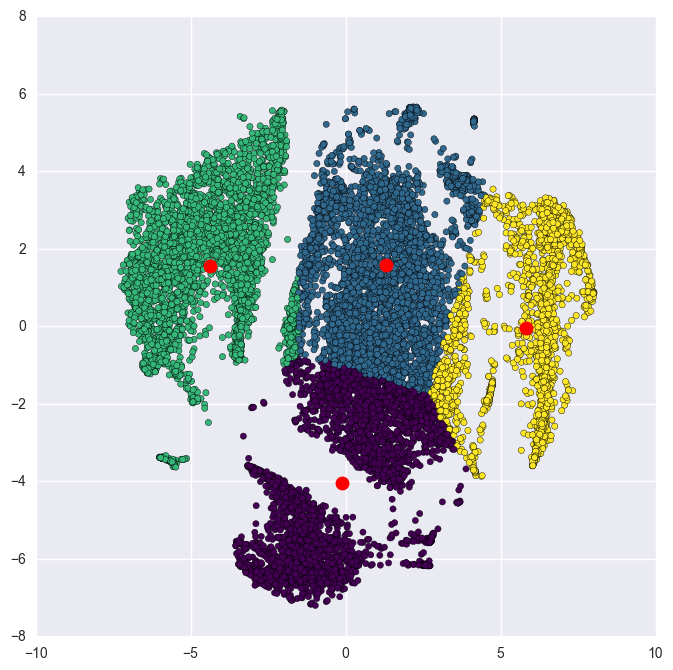

In [24]:
palette = np.array(sns.color_palette('Accent',10))
fig_lle = plt.figure(figsize=(8,8))

ax = plt.subplot()#(aspect='equal')

xdata = X_tsne[:,0]
ydata = X_tsne[:,1]
c_select = center_kmeans.labels_
ax.scatter(xdata,ydata,c=c_select,cmap='viridis',label=None)
plt.plot(center_kmeans.cluster_centers_[:,0],center_kmeans.cluster_centers_[:,1],'ro',markersize=10)
ax.legend(bbox_to_anchor=(1.55, 0.97))
plt.show()

As can be seen above, Kmeans does not perform well for the cluster colored in purple, blue and green.

## DBSCAN

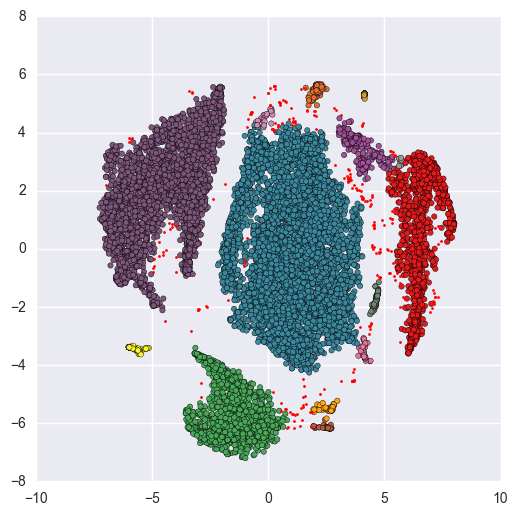

In [95]:
from sklearn.cluster import dbscan
pts_db,labels = dbscan(X_tsne,eps=0.3,min_samples=15)
cls_pts = X_tsne[labels!=-1,:]
cls_pts_labels = labels[labels!=-1]
cls_noise = X_tsne[labels==-1,:]
cls_noise_labels = X_tsne[labels==-1]

plt.figure(1,figsize=(6,6))
plt.scatter(cls_pts[:,0],cls_pts[:,1],15,cls_pts_labels,cmap='Set1')
plt.plot(cls_noise[:,0],cls_noise[:,1],'ro',ms=2)
plt.show()

As can be seen above DBSCAN does much better than KMeans. One does not require to specify the number of clusters expected. A downside of this is that some very small clusters are shown by the algorithm. The red points in the figure are what the algorithm considers to be outliers/noise.

## Affinity Propagation

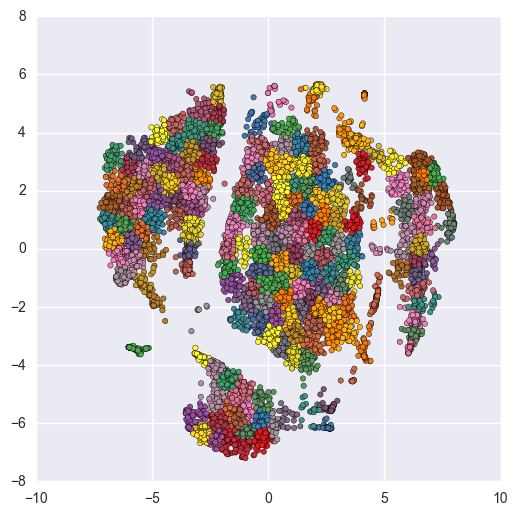

In [48]:
from sklearn.cluster import AffinityPropagation

labels_AP = AffinityPropagation(damping=0.95,preference=-5.0).fit_predict(X_tsne)

plt.figure(1,figsize=(6,6))
plt.scatter(X_tsne[:,0],X_tsne[:,1],15,labels_AP,cmap='Set1')
plt.show()

## HDBSCAN*

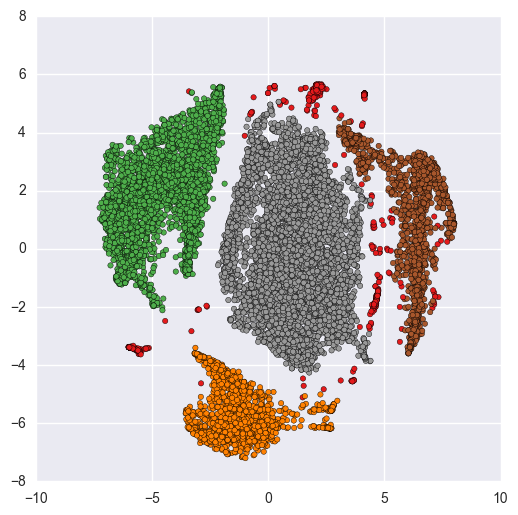

In [78]:
import hdbscan
labels_hdb = hdbscan.HDBSCAN(min_cluster_size=500,min_samples=10).fit_predict(X_tsne)
plt.figure(1,figsize=(6,6))
plt.scatter(X_tsne[:,0],X_tsne[:,1],15,labels_hdb,cmap='Set1')
plt.show()

As seen above DBSCAN or HDBSCAN* perform the best.